In [2]:
# Import Required Libraries
from pydoc import help  # can type in the python console 'help(name of function)'
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import scale
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from scipy import stats
from IPython.display import display, HTML

In [3]:
# Đọc dữ liệu
data = pd.read_csv('synthetic_wine_quality_100k.csv',header=0)



In [4]:
# Hiển thị toàn bộ dataframe (không khuyến khích với file lớn)
data



,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,magnesium,potassium,color_intensity,tannin,quality
0,8.494481,0.971169,0.339106,2.777283,0.178901,21.638599,6.499575,1.002421,3.364147,0.601275,12.166089,42.539961,89.160797,9.386826,369.014647,4
1,15.408572,0.890457,0.550412,1.884877,0.069986,36.155326,55.739460,1.002187,3.544456,1.023848,10.553020,94.150774,81.762263,2.712462,529.612789,7
2,12.783927,0.626555,0.119059,2.500118,0.019863,45.431961,235.151536,0.990532,3.769660,1.036323,8.037629,22.570486,191.730695,8.910178,395.090538,5
3,11.183902,0.839819,0.536204,7.365596,0.184751,69.460096,114.269154,1.003484,3.045882,0.950489,11.927614,111.991066,89.219971,8.033634,149.087446,2
4,5.872224,0.647645,0.243698,13.325743,0.092890,48.980944,35.847631,1.000278,2.814676,0.330670,14.275993,159.070671,85.670884,1.074774,560.809058,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,13.507658,1.033225,0.111373,11.377150,0.136449,47.429601,52.836045,0.997719,3.781395,1.809737,14.666195,16.230614,140.487711,3.011046,557.088928,8
99996,13.351035,1.043831,0.750758,4.451653,0.197994,34.066663,116.505717,0.991552,3.132907,1.043442,11.847920,184.141792,153.416581,4.924727,340.096738,4
99997,12.093441,0.388306,0.751994,8.846036,0.102671,50.138224,241.061317,1.003525,3.308818,1.010722,14.604949,17.597305,69.947007,13.497361,325.109827,4
99998,9.993367,1.079624,0.057180,13.453427,0.136347,66.944593,29.158015,1.000924,3.717804,1.028741,13.486848,103.554956,183.743684,4.188276,365.270778,4


In [5]:
# Hiển thị 5 dòng đầu tiên
data.head(5)



,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,magnesium,potassium,color_intensity,tannin,quality
0,8.494481,0.971169,0.339106,2.777283,0.178901,21.638599,6.499575,1.002421,3.364147,0.601275,12.166089,42.539961,89.160797,9.386826,369.014647,4
1,15.408572,0.890457,0.550412,1.884877,0.069986,36.155326,55.739460,1.002187,3.544456,1.023848,10.553020,94.150774,81.762263,2.712462,529.612789,7
2,12.783927,0.626555,0.119059,2.500118,0.019863,45.431961,235.151536,0.990532,3.769660,1.036323,8.037629,22.570486,191.730695,8.910178,395.090538,5
3,11.183902,0.839819,0.536204,7.365596,0.184751,69.460096,114.269154,1.003484,3.045882,0.950489,11.927614,111.991066,89.219971,8.033634,149.087446,2
4,5.872224,0.647645,0.243698,13.325743,0.092890,48.980944,35.847631,1.000278,2.814676,0.330670,14.275993,159.070671,85.670884,1.074774,560.809058,7


In [6]:
# Thông tin tổng quan về dữ liệu
data.info()



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 16 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   fixed_acidity         100000 non-null  float64
 1   volatile_acidity      100000 non-null  float64
 2   citric_acid           100000 non-null  float64
 3   residual_sugar        100000 non-null  float64
 4   chlorides             100000 non-null  float64
 5   free_sulfur_dioxide   100000 non-null  float64
 6   total_sulfur_dioxide  100000 non-null  float64
 7   density               100000 non-null  float64
 8   pH                    100000 non-null  float64
 9   sulphates             100000 non-null  float64
 10  alcohol               100000 non-null  float64
 11  magnesium             100000 non-null  float64
 12  potassium             100000 non-null  float64
 13  color_intensity       100000 non-null  float64
 14  tannin                100000 non-null  float64
 15  q


*Tìm hiểu dữ liệu,trả lời được
có bao nhiêu sample(là mẫu,có bao nhiêu hàng là bao nhiêu mẫu)
bao nhiêu biến số:14
kiểu dữ liệu từng biến số: hàm info
non-null nghĩa là ko thiếu dữ liệu


*mô tả ý nghĩa dữ liệu:
V1: chất lượng rượu vang-> có 3 nhãn={1,2,3}
V2 đến V14: thành phần hoá học tạo nên rượu vang
*Nội dung phân tích: phân tích thành phần hoá học tác động đến chất lượng rượu vang
phải hiểu đc:
-biến số giải thích(explanatory),độc lập(independent):V2,...,V14
-biến phụ thuộc(dependent),biến mục tiêu(target): V1
+loại biến: biến phân loại(categorical data),biến định lượng(numerical data)

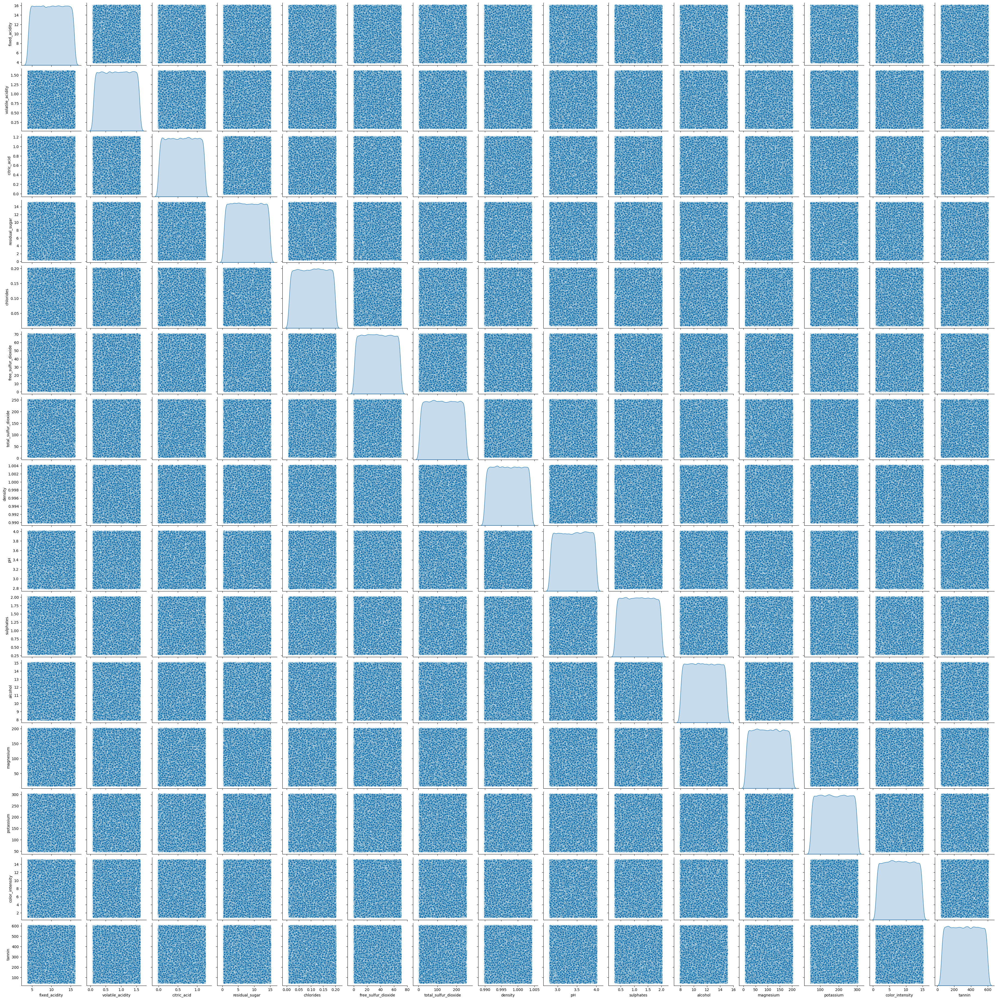

In [ ]:
# Trực quan phân phối và tương quan các biến định lượng (fixed_acidity - tannin)
sns.pairplot(data.loc[:,"fixed_acidity":"tannin"],diag_kind='kde')
plt.show()
'''
trả lời đc: chat trên đường chéo thể hiện điều gì
chart không nằm trên đường chéo thể hiện gì
kết luận gì về phân phối các biến định lượng và tương quan
'''



In [8]:
# Phân tích về phân phối: độ xiên, độ nhọn
data.loc[:,"fixed_acidity":"tannin"].skew()
data.loc[:,"fixed_acidity":"tannin"].kurtosis()



fixed_acidity          -1.200627
volatile_acidity       -1.200787
citric_acid            -1.199007
residual_sugar         -1.201736
chlorides              -1.196409
free_sulfur_dioxide    -1.194450
total_sulfur_dioxide   -1.198341
density                -1.200216
pH                     -1.206199
sulphates              -1.196521
alcohol                -1.199034
magnesium              -1.196632
potassium              -1.202382
color_intensity        -1.188544
tannin                 -1.200935
dtype: float64

In [9]:
# Phân tích tương quan tuyến tính pearson
data.loc[:,"fixed_acidity":"tannin"].corr()



,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,magnesium,potassium,color_intensity,tannin
fixed_acidity,1.000000,-0.001772,-0.007916,-0.000690,-0.003505,-0.000623,0.002213,-0.000326,-0.003927,-0.009474,0.000065,-0.001702,0.001192,-0.000153,0.004616
volatile_acidity,-0.001772,1.000000,0.000798,0.003668,0.002229,-0.001131,-0.004072,0.000771,0.001575,0.001437,0.002952,-0.001575,0.002033,-0.001830,-0.000587
citric_acid,-0.007916,0.000798,1.000000,0.004636,0.007905,-0.002340,0.004342,-0.000067,0.004500,0.002613,-0.002138,0.001289,0.001127,0.003117,-0.000598
residual_sugar,-0.000690,0.003668,0.004636,1.000000,0.003741,0.002485,-0.000955,0.001556,-0.004785,0.000633,0.000006,0.004630,0.001101,-0.000729,-0.000910
chlorides,-0.003505,0.002229,0.007905,0.003741,1.000000,-0.006082,-0.002361,0.000312,0.000436,0.005682,0.005178,0.000615,0.002544,0.001935,0.000758
free_sulfur_dioxide,-0.000623,-0.001131,-0.002340,0.002485,-0.006082,1.000000,-0.007767,-0.005600,-0.002607,-0.003578,-0.004570,-0.001500,-0.001619,-0.005783,0.001074
total_sulfur_dioxide,0.002213,-0.004072,0.004342,-0.000955,-0.002361,-0.007767,1.000000,-0.001646,-0.001097,-0.001481,-0.001206,0.003643,0.000003,-0.002239,0.000981
density,-0.000326,0.000771,-0.000067,0.001556,0.000312,-0.005600,-0.001646,1.000000,-0.004056,0.000579,0.003827,-0.001103,-0.002246,0.000771,0.004054
pH,-0.003927,0.001575,0.004500,-0.004785,0.000436,-0.002607,-0.001097,-0.004056,1.000000,0.002063,0.002452,-0.000264,0.005362,-0.004257,0.005024
sulphates,-0.009474,0.001437,0.002613,0.000633,0.005682,-0.003578,-0.001481,0.000579,0.002063,1.000000,0.003420,-0.003470,0.004619,0.002983,-0.001102


In [ ]:
# Phân tích sâu vào từng cặp biến trên các nhãn mục tiêu
sns.lmplot(x="residual_sugar",y="chlorides",data=data,hue="fixed_acidity",fit_reg=False)



In [ ]:
# Phân tích profile: giá trị trung bình, độ lệch chuẩn của các biến số định lượng
ax=data[:,"fixed_acidity":"tannin"].plot()
ax.legend(loc='center left',bbox_to_anchor=(1,0.5));



In [ ]:
# Thống kê mô tả dữ liệu
data.loc[:,"fixed_acidity":"tannin"].describe()



In [ ]:
# Thống kê mô tả số liệu biến định lượng trên nhóm là biến mục tiêu
groups=data[["fixed_acidity","volatile_acidity","citric_acid"]].groupby('fixed_acidity')
groups.describe().T